# A picture

1 1 -2.75 0.75
1 -2 -1.25 2.25


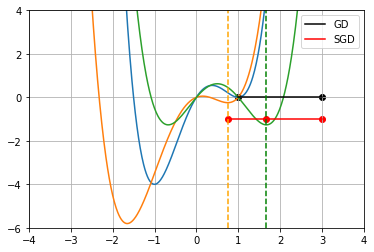

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


def g(x, a, b, c, d):
    return a * x ** 4 + b * x ** 3 + c * x ** 2 + d * x


def f(x, a=1, b=1):
    return g(x, a, b, -2 * a, -3 * b)


def compute_d(a, b, c, x2):
    return -4 * a * x2 ** 3 - 3 * b * x2 ** 2 - 2 * c * x2


def h(x, a, b, x1, x2):
    c = -(4 * a * (x1 ** 3 - x2 ** 3) + 3 * b * (x1 ** 2 - x2 ** 2)) / 2 / (x1 - x2)
    d = compute_d(a, b, c, x2)
    return g(x, a, b, c, d)


def get_pair(x, a, b, n, q, a1, b1):
    if n == 0:
        denom = (8 - (4 * q - 4) / (q + 1) - 2 / q ** 2 - (2 * q - 2) / (3 * q ** 2 + 3))
        print(denom)
        a1 = (6 * a - 3 * b / 2  * (1 - q)) / denom
        b1 = (-3 * b - 3 * b * q - a1 * (4 - 4 / q ** 2)) / (-3 / q - 3)
    a2 = a - a1
    b2 = b - b1
    c1 = 4 * a * n + 3 * b * q / 2 - 2 / q / q * (a1 * (2 * n + 1) ** 3 + a2 * 8 * n ** 3)
    c1 -= 3 / 2 / q * (b1 * (2 * n + 1) ** 2 + b2 * (2 * n) ** 2)
    c2 = -2 * a - c1
    d1 = compute_d(a1, b1, c1, (2 * n + 1) / q)
    d2 = -3 * b - d1
    print(a1, b1, c1, d1)
    print(a2, b2, c2, d2)
    return g(x, a1, b1, c1, d1), g(x, a2, b2, c2, d2)


plt.grid(True)
x = np.arange(-10, 10, 0.01)
y = f(x, 2, -1)
plt.plot(x, y)
plt.ylim(-6, 4)
plt.xlim(-4, 4)
# plt.plot(x, h(x, 3, 1, 1, -1))
# plt.plot(x, h(x, 2, -1, -1, 1))
y1, y2 = get_pair(x, 2, -1, n=1, q=4, a1=1, b1=1)
plt.plot(x, y1)
plt.plot(x, y2)
plt.scatter([3, 1], [0, 0], c='black')
plt.plot([3, 1], [0, 0], c='black', label="GD")
plt.scatter([3, 1.6726, 0.75], [-1, -1, -1], c='red')
plt.plot([3, 1.6726, 0.75], [-1, -1, -1], c='red', label="SGD")
plt.axvline(x=1.6726, linestyle='dashed', c='green')
plt.axvline(x=0.75, linestyle='dashed', c='orange')
plt.legend(loc='best')
plt.savefig("fig.png", bbox_inches="tight")

# Functions

In [1]:
!wget --quiet --show-progress "https://raw.githubusercontent.com/aosokin/dl_cshse_ami/master/2021-fall/homeworks_small/shw3/util.py"

util.py             100%[===================>]   3.79K  --.-KB/s    in 0s      


In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import clear_output

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.datasets as dsets
import torchvision.transforms as transforms
import torch.optim as optim
from torch.utils.data.sampler import Sampler, BatchSampler
from torch.nn.modules.loss import MSELoss

In [3]:
class ConvNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(1, 8, 5)
        self.fc1 = nn.Linear(8 * 24 * 24, 10)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        return x

In [4]:
from util import iterate_minibatches
from torch.nn.utils import clip_grad_norm_

        
def train_epoch(model, optimizer, X, y, batchsize, clip=False,
                gradient_penalty=False, step_last=False):
    loss_log, acc_log = [], []
    model.train()
    if y is not None:
        iter_range = iterate_minibatches(X, y, batchsize=batchsize,
                                         shuffle=True)
    else:
        iter_range = X
    for x_batch, y_batch in iter_range:
        if y is not None:
            data = torch.from_numpy(x_batch.reshape(-1, 1, 28, 28).astype(
                np.float32))
            target = torch.from_numpy(y_batch.astype(np.int64))
        else:
            data = x_batch.cuda()
            target = y_batch.cuda()
        optimizer.zero_grad()
        output = model(data)
        
        if y is not None:
            pred = torch.max(output, 1)[1].numpy()
            acc = np.mean(pred == y_batch)
        else:
            pred = torch.max(output, 1)[1]
            acc = torch.eq(pred, y_batch.cuda()).float().mean().item()
        acc_log.append(acc)
        
        loss = F.cross_entropy(output, target)

        if gradient_penalty:
            # Creates gradients
            grad_params = torch.autograd.grad(outputs=loss,
                                              inputs=model.parameters(),
                                              create_graph=True)

            # Computes the penalty term and adds it to the loss
            grad_norm = 0
            for grad in grad_params:
                grad_norm += grad.pow(2).sum()
            grad_norm = grad_norm.sqrt()
            coeff = optimizer.param_groups[0]["lr"] / 4 
            # coeff = 0.1
            loss = loss + coeff * grad_norm

        loss.backward()
        if clip and not step_last:
            clip_grad_norm_(model.parameters(), 0.25)
        if not step_last:
            optimizer.step()
        loss = loss.item()
        loss_log.append(loss)
    if step_last:
        if clip:
            clip_grad_norm_(model.parameters(), 0.25)
        optimizer.step()
    return loss_log, acc_log

def test(model, X, y):
    loss_log, acc_log = [], []
    model.eval()
    if y is not None:
        iter_range = iterate_minibatches(X, y, batchsize=128, shuffle=True)
    else:
        iter_range = X
    for x_batch, y_batch in iter_range:  
        if y is not None:
            data = torch.from_numpy(x_batch.reshape(-1, 1, 28, 28).astype(
                np.float32))
            target = torch.from_numpy(y_batch.astype(np.int64))
        else:
            data = x_batch.cuda()
            target = y_batch.cuda()
        output = model(data)
        loss = F.cross_entropy(output, target)
        
        if y is not None:
            pred = torch.max(output, 1)[1].numpy()
            acc = np.mean(pred == y_batch)
        else:
            pred = torch.max(output, 1)[1]
            acc = torch.eq(pred, y_batch.cuda()).float().mean().item()
        acc_log.append(acc)
        
        loss = loss.item()
        loss_log.append(loss)
    return loss_log, acc_log

def plot_history(train_history, val_history, title='loss'):
    plt.figure()
    plt.title('{}'.format(title))
    plt.plot(train_history, label='train', zorder=1)
    
    points = np.array(val_history)
    
    plt.scatter(points[:, 0], points[:, 1], marker='+', s=180, c='orange',
                label='val', zorder=2)
    plt.xlabel('train steps')
    
    plt.legend(loc='best')
    plt.grid()

    plt.show()
    
def train(model, opt, n_epochs, X_train, y_train, X_val, y_val, batchsize,
          scheduler=None, clip=False, gradient_penalty=False, step_last=False):
    train_log, train_acc_log = [], []
    val_log, val_acc_log = [], []

    for epoch in range(n_epochs):
        train_loss, train_acc = train_epoch(model, opt, X_train, y_train,
                                            batchsize, clip=clip,
                                            gradient_penalty=gradient_penalty,
                                            step_last=step_last)
        if scheduler is not None:
            scheduler.step()
        val_loss, val_acc = test(model, X_val, y_val)

        train_log.extend(train_loss)
        train_acc_log.extend(train_acc)

        if y_train is not None:
            steps = len(X_train) / batchsize
        else:
            steps = len(X_train)
        val_log.append((steps * (epoch + 1), np.mean(val_loss)))
        val_acc_log.append((steps * (epoch + 1), np.mean(val_acc)))

        clear_output()
        plot_history(train_log, val_log)    
        plot_history(train_acc_log, val_acc_log, title='accuracy')   
            
    print("Final validaion accuracy: {:.2%}".format(val_acc_log[-1][1]))

# MNIST

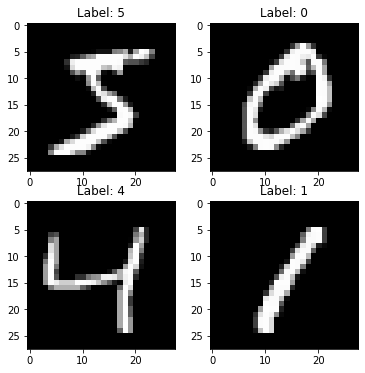

In [ ]:
from util import load_mnist
X_train, y_train, X_val, y_val, X_test, y_test = load_mnist(flatten=True)

plt.figure(figsize=[6, 6])
for i in range(4):
    plt.subplot(2, 2, i + 1)
    plt.title("Label: %i" % y_train[i])
    plt.imshow(X_train[i].reshape([28, 28]), cmap='gray');

## SGD

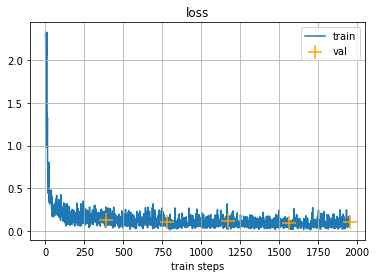

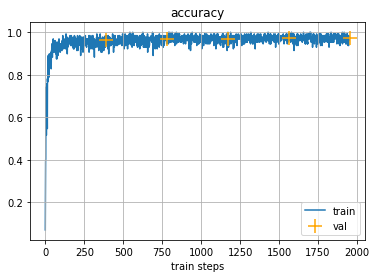

Final validaion accuracy: 97.12%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.9696
CPU times: user 27.9 s, sys: 791 ms, total: 28.7 s
Wall time: 28.4 s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
train(model, opt, 5, X_train, y_train, X_val, y_val, 128)
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "SGD_model_checkpoint")

## GD

### The same hyperparameters

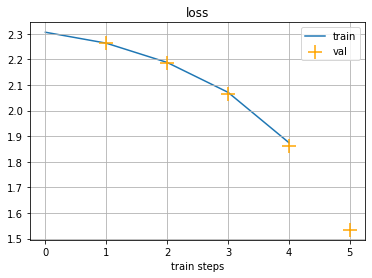

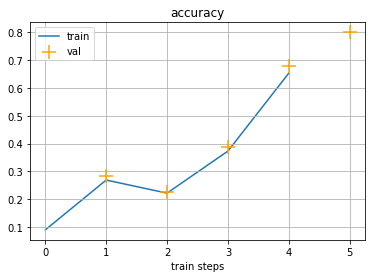

Final validaion accuracy: 79.98%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.7901
CPU times: user 27.1 s, sys: 2.35 s, total: 29.4 s
Wall time: 29.4 s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
train(model, opt, 5, X_train, y_train, X_val, y_val, len(X_train))
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_model_checkpoint")

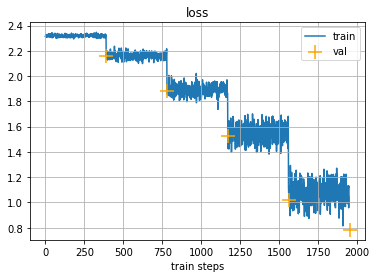

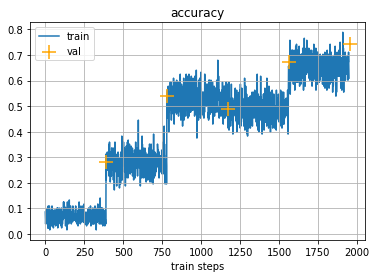

Final validaion accuracy: 74.22%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.7126
CPU times: user 22.8 s, sys: 960 ms, total: 23.8 s
Wall time: 23.6 s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
train(model, opt, 5, X_train, y_train, X_val, y_val, 128,
      step_last=True)
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_model_checkpoint_step_last")

### 20 times more epochs

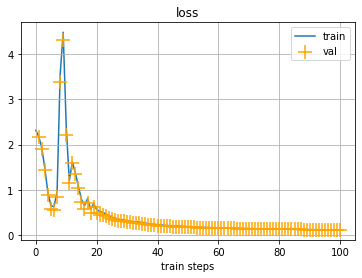

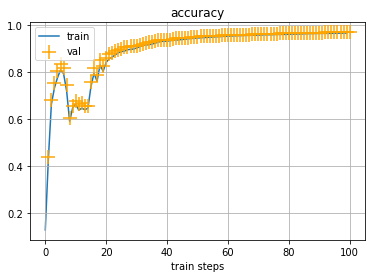

Final validaion accuracy: 97.08%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.9699
CPU times: user 8min 59s, sys: 11.5 s, total: 9min 11s
Wall time: 9min 11s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
train(model, opt, 100, X_train, y_train, X_val, y_val, len(X_train))
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_longer_model_checkpoint")

### Gradient clipping

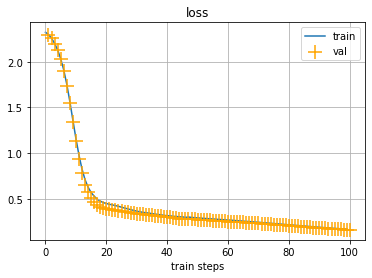

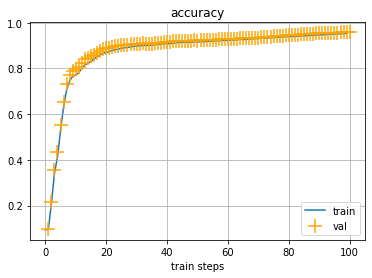

Final validaion accuracy: 95.83%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.9574
CPU times: user 7min 41s, sys: 14 s, total: 7min 55s
Wall time: 7min 54s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
train(model, opt, 100, X_train, y_train, X_val, y_val, len(X_train), clip=True)
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_longer_model_checkpoint_clipping")

### Larger LR

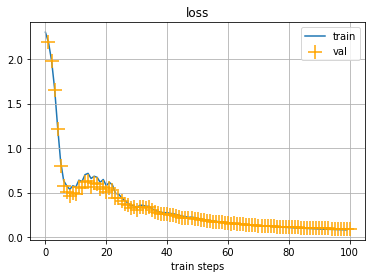

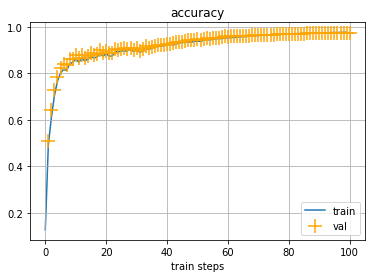

Final validaion accuracy: 97.52%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.9756
CPU times: user 7min 31s, sys: 12.2 s, total: 7min 44s
Wall time: 7min 44s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.4, momentum=0.9,
                      weight_decay=0.0005)
train(model, opt, 100, X_train, y_train, X_val, y_val, len(X_train), clip=True)
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_longer_model_checkpoint_clipping_LR04")

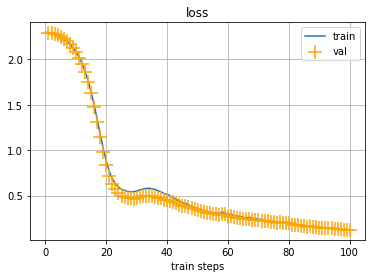

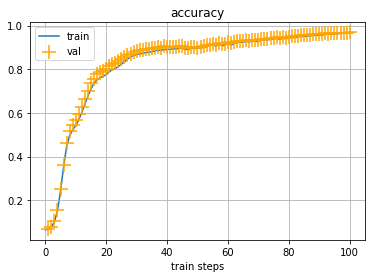

Final validaion accuracy: 96.92%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.968
CPU times: user 7min 32s, sys: 12.4 s, total: 7min 45s
Wall time: 7min 45s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.4, momentum=0.9,
                      weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.4,
                                                total_steps=300)
train(model, opt, 100, X_train, y_train, X_val, y_val, len(X_train), clip=True,
      scheduler=scheduler)
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_longer_model_checkpoint_clipping_1cycleLR")

### Gradient penalty

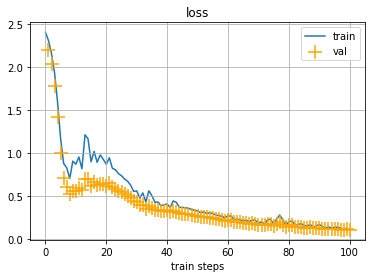

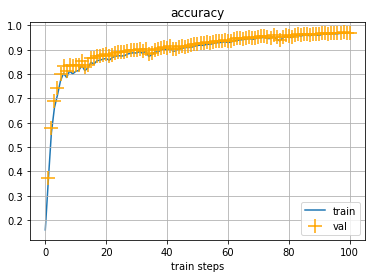

Final validaion accuracy: 96.96%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.9707
CPU times: user 17min 53s, sys: 22.3 s, total: 18min 15s
Wall time: 18min 14s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.4, momentum=0.9,
                      weight_decay=0.0005)
train(model, opt, 100, X_train, y_train, X_val, y_val, len(X_train), clip=True,
      gradient_penalty=True)
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_longer_model_checkpoint_clipping_LR04_gradient_penalty")

# FashionMNIST

In [ ]:
import sys
import os
import time

import numpy as np
from tqdm.auto import tqdm
import matplotlib.pyplot as plt


def load_fashion_mnist(flatten=False):
    # We first define a download function, supporting both Python 2 and 3.
    if sys.version_info[0] == 2:
        from urllib import urlretrieve
    else:
        from urllib.request import urlretrieve

    def download(filename, source='http://fashion-mnist.s3-website.eu-central-1.amazonaws.com/'):
        print("Downloading %s" % filename)
        urlretrieve(source + filename, filename)

    # We then define functions for loading MNIST images and labels.
    # For convenience, they also download the requested files if needed.
    import gzip

    def load_mnist_images(filename):
        if not os.path.exists(filename):
            download(filename)
        # Read the inputs in Yann LeCun's binary format.
        with gzip.open(filename, 'rb') as f:
            data = np.frombuffer(f.read(), np.uint8, offset=16)
        # The inputs are vectors now, we reshape them to monochrome 2D images,
        # following the shape convention: (examples, channels, rows, columns)
        data = data.reshape(-1, 1, 28, 28)
        # The inputs come as bytes, we convert them to float32 in range [0,1].
        # (Actually to range [0, 255/256], for compatibility to the version
        # provided at http://deeplearning.net/data/mnist/mnist.pkl.gz.)
        return data / np.float32(256)

    def load_mnist_labels(filename):
        if not os.path.exists(filename):
            download(filename)
        # Read the labels in Yann LeCun's binary format.
        with gzip.open(filename, 'rb') as f:
            data = np.frombuffer(f.read(), np.uint8, offset=8)
        # The labels are vectors of integers now, that's exactly what we want.
        return data

    # We can now download and read the training and test set images and labels.
    X_train = load_mnist_images('train-images-idx3-ubyte.gz')
    y_train = load_mnist_labels('train-labels-idx1-ubyte.gz')
    X_test = load_mnist_images('t10k-images-idx3-ubyte.gz')
    y_test = load_mnist_labels('t10k-labels-idx1-ubyte.gz')

    # We reserve the last 10000 training examples for validation.
    X_train, X_val = X_train[:-10000], X_train[-10000:]
    y_train, y_val = y_train[:-10000], y_train[-10000:]

    if flatten:
        X_train = X_train.reshape([X_train.shape[0], -1])
        X_val = X_val.reshape([X_val.shape[0], -1])
        X_test = X_test.reshape([X_test.shape[0], -1])

    # We just return all the arrays in order, as expected in main().
    # (It doesn't matter how we do this as long as we can read them again.)
    return X_train, y_train, X_val, y_val, X_test, y_test

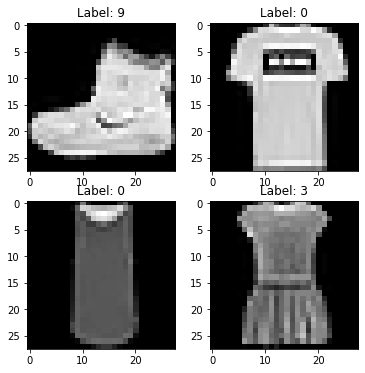

In [ ]:
X_train, y_train, X_val, y_val, X_test, y_test = load_fashion_mnist(flatten=True)

plt.figure(figsize=[6, 6])
for i in range(4):
    plt.subplot(2, 2, i + 1)
    plt.title("Label: %i" % y_train[i])
    plt.imshow(X_train[i].reshape([28, 28]), cmap='gray');

## SGD

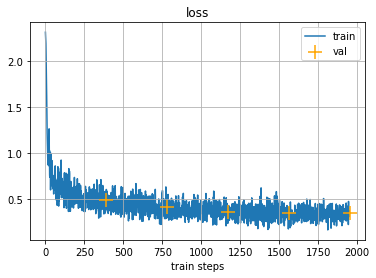

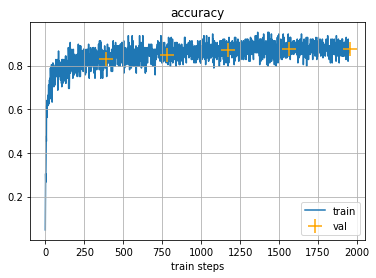

Final validaion accuracy: 87.58%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.8706
CPU times: user 26.9 s, sys: 768 ms, total: 27.7 s
Wall time: 27.5 s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9,
                      weight_decay=0.0005)
train(model, opt, 5, X_train, y_train, X_val, y_val, 128)
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "SGD_fashion_model_checkpoint")

## GD

### The same hyperparameters

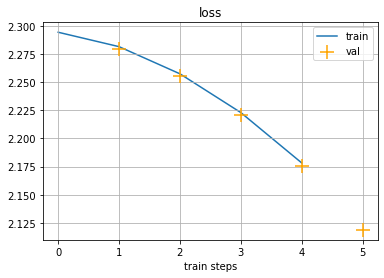

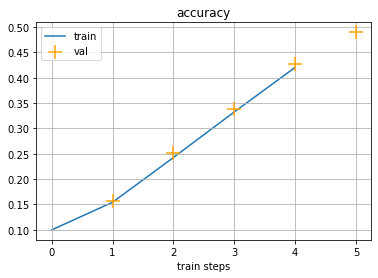

Final validaion accuracy: 48.98%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.4756
CPU times: user 27.4 s, sys: 638 ms, total: 28 s
Wall time: 27.9 s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9,
                      weight_decay=0.0005)
train(model, opt, 5, X_train, y_train, X_val, y_val, len(X_train))
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_fashion_model_checkpoint")

### Train longer

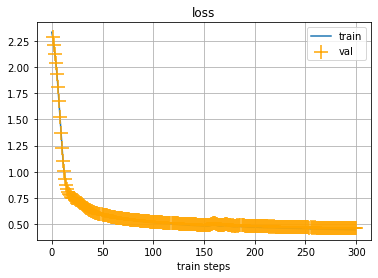

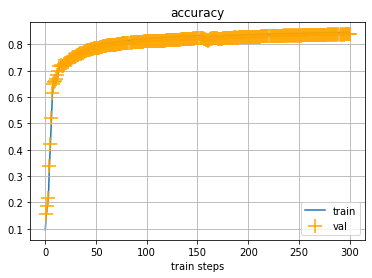

Final validaion accuracy: 83.85%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.8315
CPU times: user 26min 20s, sys: 34.6 s, total: 26min 55s
Wall time: 26min 56s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9,
                      weight_decay=0.0005)
train(model, opt, 300, X_train, y_train, X_val, y_val, len(X_train))
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_fashion_model_checkpoint_300")

### Fine-tune LR

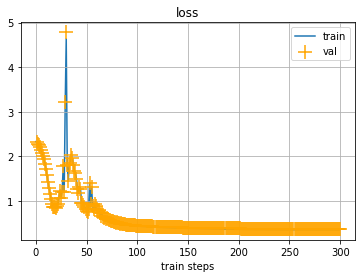

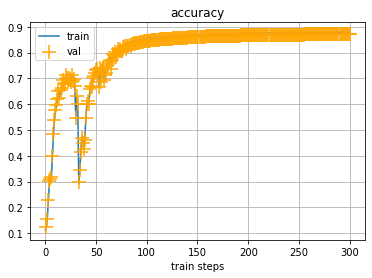

Final validaion accuracy: 87.11%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.8661
CPU times: user 26min 43s, sys: 35.1 s, total: 27min 18s
Wall time: 27min 21s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.1,
                                                total_steps=300)
train(model, opt, 300, X_train, y_train, X_val, y_val, len(X_train),
      scheduler=scheduler)
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_fashion_model_checkpoint_1cycleLR")

### Gradient clipping

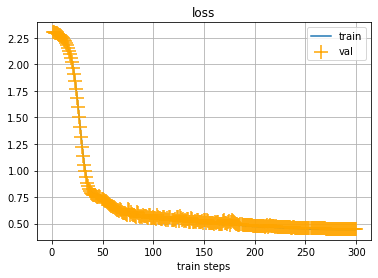

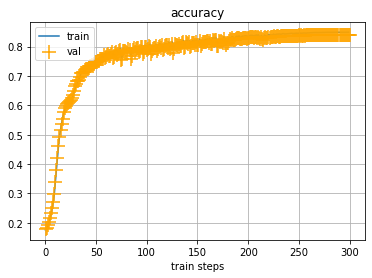

Final validaion accuracy: 84.08%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.8308
CPU times: user 26min 41s, sys: 35 s, total: 27min 16s
Wall time: 27min 18s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.1,
                                                total_steps=300)
train(model, opt, 300, X_train, y_train, X_val, y_val, len(X_train),
      scheduler=scheduler, clip=True)
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_fashion_model_checkpoint_1cycleLR_clip")

### Gradient clipping, change parameters

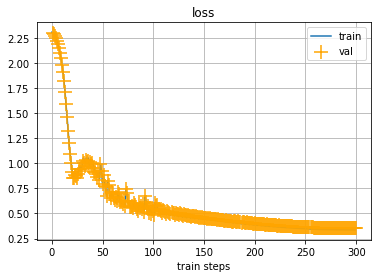

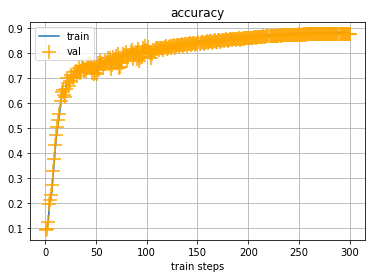

Final validaion accuracy: 87.72%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.87
CPU times: user 26min 38s, sys: 34.7 s, total: 27min 12s
Wall time: 27min 15s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.4, momentum=0.9,
                      weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.4,
                                                total_steps=300)
train(model, opt, 300, X_train, y_train, X_val, y_val, len(X_train),
      scheduler=scheduler, clip=True)
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_fashion_model_checkpoint_1cycleLR_clip")

### Gradient penalty

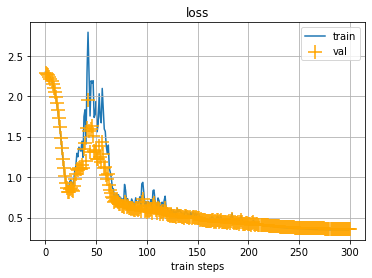

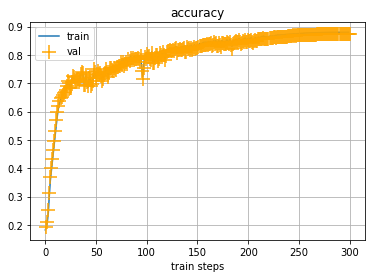

Final validaion accuracy: 87.26%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.8649
CPU times: user 1h 4min 26s, sys: 1min 27s, total: 1h 5min 54s
Wall time: 1h 5min 52s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.4, momentum=0.9,
                      weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.4,
                                                total_steps=300)
train(model, opt, 300, X_train, y_train, X_val, y_val, len(X_train),
      scheduler=scheduler, clip=True, gradient_penalty=True)
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_fashion_model_checkpoint_1cycleLR_clip_penalty_right_step")

### Gradient penalty, change parameters

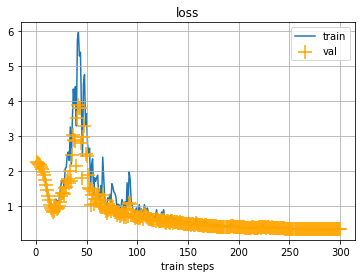

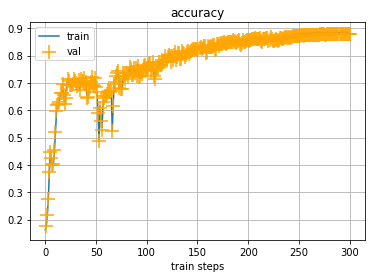

Final validaion accuracy: 87.79%


  0%|          | 0/1 [00:00<?, ?it/s]

Result on test: 0.8702
CPU times: user 1h 4min 57s, sys: 1min 27s, total: 1h 6min 25s
Wall time: 1h 6min 23s


In [ ]:
%%time

model = ConvNet()
opt = torch.optim.SGD(model.parameters(), lr=0.8, momentum=0.9,
                      weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.8,
                                                total_steps=300)
train(model, opt, 300, X_train, y_train, X_val, y_val, len(X_train),
      scheduler=scheduler, clip=True, gradient_penalty=True)
_, test_acc = test(model, X_test, y_test)
print("Result on test:", test_acc[0])
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_fashion_model_checkpoint_1cycleLR08_clip_penalty_right_step")

# Cifar10

In [6]:
from torchvision import transforms
import torchvision

transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

batch_size = 32

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


In [7]:
class ConvNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Sequential(
                nn.Conv2d(3, 32, 3, padding='same'), # kernel_initializer='he_uniform'
                nn.ReLU(),
                nn.Conv2d(32, 32, 3, padding="same"),
                nn.ReLU(),
                nn.MaxPool2d(2)
            )
        self.fc1 = nn.Linear(32 * 16 * 16, 128)
        self.fc2 = nn.Linear(128, 10)
    
    def forward(self, x):
        x = self.conv(x)
        x = torch.flatten(x, 1)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

## SGD

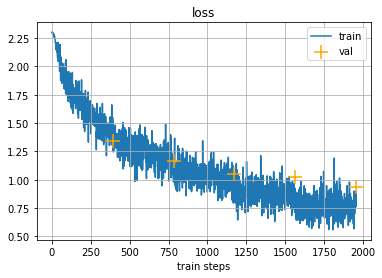

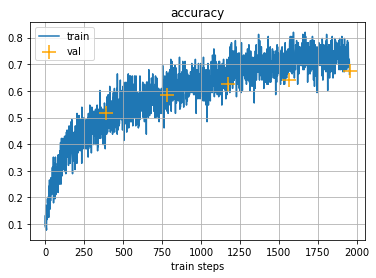

Final validaion accuracy: 67.44%
CPU times: user 24.2 s, sys: 2.81 s, total: 27 s
Wall time: 1min 5s


In [ ]:
%%time

trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                          shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=128,
                                         shuffle=False, num_workers=2)
model = ConvNet().cuda()
opt = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9,
                      weight_decay=0.0005)
train(model, opt, 5, X_train=trainloader, y_train=None, X_val=testloader,
      y_val=None, batchsize=128)
_, test_acc = test(model, testloader, y=None)
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "SGD_cifar10_checkpoint")

## GD

### Same hyperparams

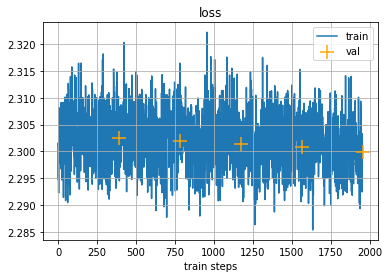

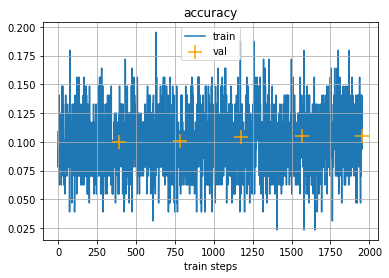

Final validaion accuracy: 10.55%
CPU times: user 24.2 s, sys: 2.62 s, total: 26.8 s
Wall time: 1min 3s


In [ ]:
%%time

trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                          shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=128,
                                         shuffle=False, num_workers=2)
model = ConvNet().cuda()
opt = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9,
                      weight_decay=0.0005)
train(model, opt, 5, X_train=trainloader, y_train=None, X_val=testloader,
      y_val=None, batchsize=128, step_last=True)
_, test_acc = test(model, testloader, y=None)
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_cifar10_checkpoint")

### Change lr

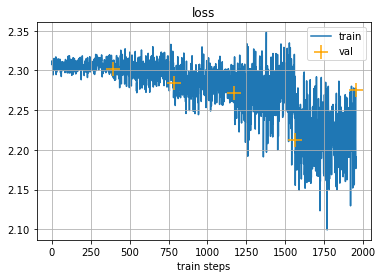

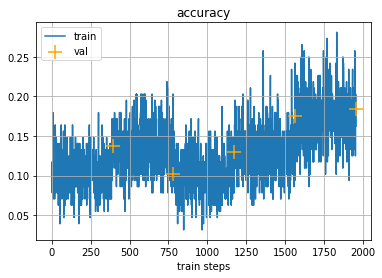

Final validaion accuracy: 18.36%
CPU times: user 24.4 s, sys: 2.8 s, total: 27.2 s
Wall time: 1min 5s


In [ ]:
%%time

trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                          shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=128,
                                         shuffle=False, num_workers=2)
model = ConvNet().cuda()
opt = torch.optim.SGD(model.parameters(), lr=0.4, momentum=0.9,
                      weight_decay=0.0005)
train(model, opt, 5, X_train=trainloader, y_train=None, X_val=testloader,
      y_val=None, batchsize=128, step_last=True)
_, test_acc = test(model, testloader, y=None)
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_cifar10_checkpoint")

### 20 epochs

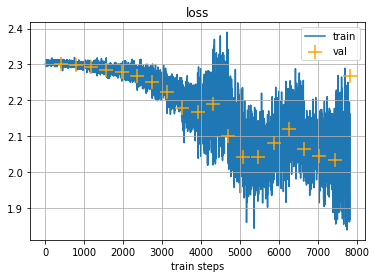

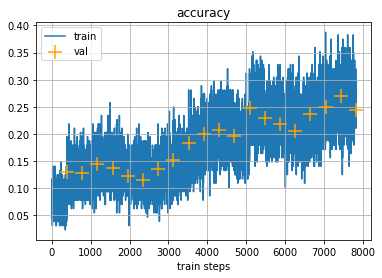

Final validaion accuracy: 24.37%
CPU times: user 1min 33s, sys: 10.3 s, total: 1min 43s
Wall time: 4min 7s


In [ ]:
%%time

trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                          shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=128,
                                         shuffle=False, num_workers=2)
model = ConvNet().cuda()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
train(model, opt, 20, X_train=trainloader, y_train=None, X_val=testloader,
      y_val=None, batchsize=128, step_last=True)
_, test_acc = test(model, testloader, y=None)
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_cifar10_checkpoint")

### 1CycleLR

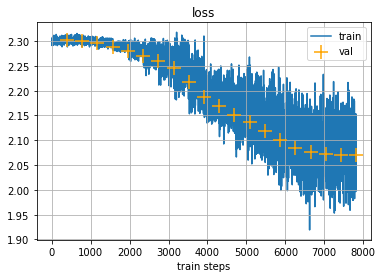

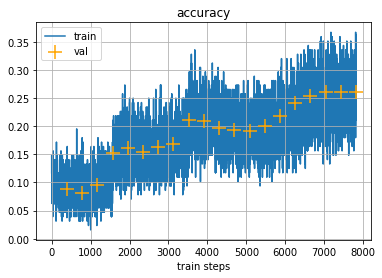

Final validaion accuracy: 26.11%
CPU times: user 1min 34s, sys: 10.3 s, total: 1min 44s
Wall time: 4min 6s


In [ ]:
%%time

trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                          shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=128,
                                         shuffle=False, num_workers=2)
model = ConvNet().cuda()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.1,
                                                total_steps=20)
train(model, opt, 20, X_train=trainloader, y_train=None, X_val=testloader,
      y_val=None, batchsize=128, step_last=True, scheduler=scheduler)
_, test_acc = test(model, testloader, y=None)
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_cifar10_checkpoint")

### 40 epochs

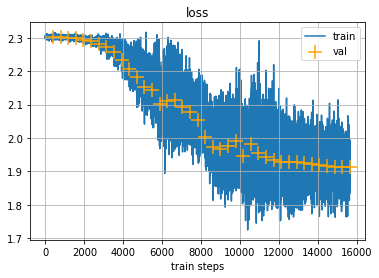

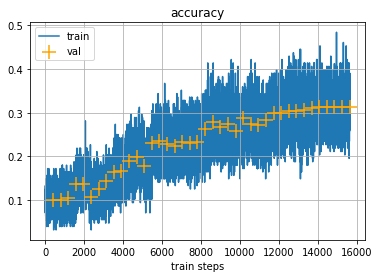

Final validaion accuracy: 31.37%
CPU times: user 8min 17s, sys: 21.1 s, total: 8min 38s
Wall time: 13min


In [9]:
%%time

trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                          shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=128,
                                         shuffle=False, num_workers=2)
model = ConvNet().cuda()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.1,
                                                total_steps=40)
train(model, opt, 40, X_train=trainloader, y_train=None, X_val=testloader,
      y_val=None, batchsize=128, step_last=True, scheduler=scheduler)
_, test_acc = test(model, testloader, y=None)
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_cifar10_checkpoint_clip")

### 300 epochs

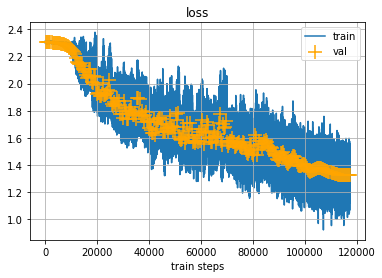

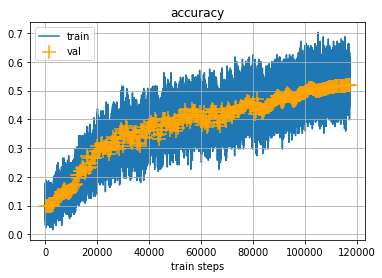

Final validaion accuracy: 51.81%
CPU times: user 23min 39s, sys: 2min 40s, total: 26min 19s
Wall time: 1h 1min 30s


In [ ]:
%%time

trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                          shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=128,
                                         shuffle=False, num_workers=2)
model = ConvNet().cuda()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.1,
                                                total_steps=300)
train(model, opt, 300, X_train=trainloader, y_train=None, X_val=testloader,
      y_val=None, batchsize=128, step_last=True, scheduler=scheduler)
_, test_acc = test(model, testloader, y=None)
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_cifar10_checkpoint_clip")

### Gradient Clipping

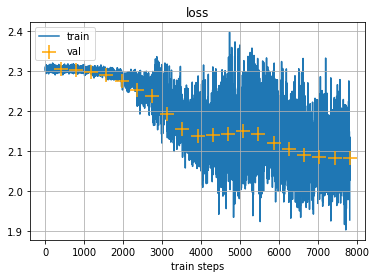

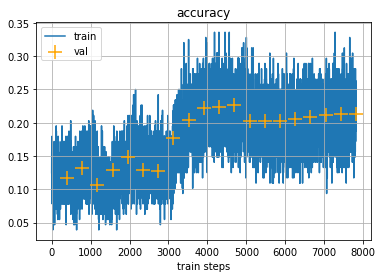

Final validaion accuracy: 21.35%
CPU times: user 1min 34s, sys: 10.6 s, total: 1min 45s
Wall time: 4min 10s


In [ ]:
%%time

trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                          shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=128,
                                         shuffle=False, num_workers=2)
model = ConvNet().cuda()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.4,
                                                total_steps=20)
train(model, opt, 20, X_train=trainloader, y_train=None, X_val=testloader,
      y_val=None, batchsize=128, step_last=True, scheduler=scheduler, clip=True)
_, test_acc = test(model, testloader, y=None)
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_cifar10_checkpoint_clip")

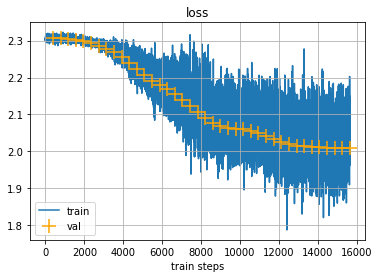

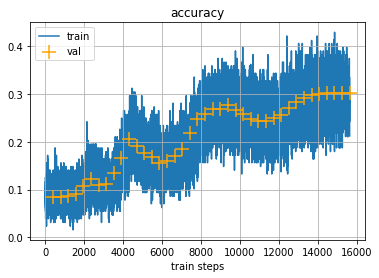

Final validaion accuracy: 30.31%
CPU times: user 3min 9s, sys: 21.3 s, total: 3min 30s
Wall time: 8min 21s


In [ ]:
%%time

trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                          shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=128,
                                         shuffle=False, num_workers=2)
model = ConvNet().cuda()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.1,
                                                total_steps=40)
train(model, opt, 40, X_train=trainloader, y_train=None, X_val=testloader,
      y_val=None, batchsize=128, step_last=True, scheduler=scheduler, clip=True)
_, test_acc = test(model, testloader, y=None)
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_cifar10_checkpoint_clip")

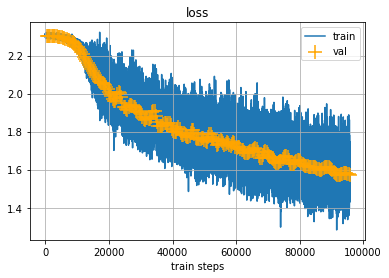

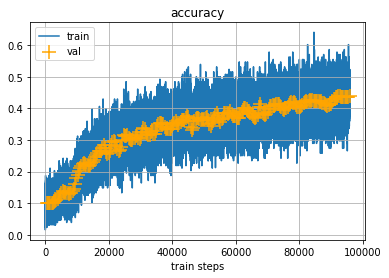

In [ ]:
%%time

trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                          shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=128,
                                         shuffle=False, num_workers=2)
model = ConvNet().cuda()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.1,
                                                total_steps=300)
train(model, opt, 300, X_train=trainloader, y_train=None, X_val=testloader,
      y_val=None, batchsize=128, step_last=True, scheduler=scheduler, clip=True)
_, test_acc = test(model, testloader, y=None)
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_cifar10_checkpoint_clip")

### Gradient penalty

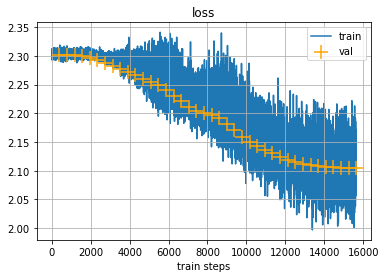

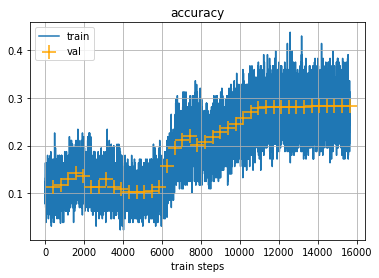

Final validaion accuracy: 28.33%
CPU times: user 5min 55s, sys: 23 s, total: 6min 18s
Wall time: 9min 51s


In [ ]:
%%time

trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                          shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=128,
                                         shuffle=False, num_workers=2)
model = ConvNet().cuda()
opt = torch.optim.SGD(model.parameters(), lr=0.1, momentum=0.9,
                      weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.1,
                                                total_steps=40)
train(model, opt, 40, X_train=trainloader, y_train=None, X_val=testloader,
      y_val=None, batchsize=128, step_last=True, scheduler=scheduler, clip=True,
      gradient_penalty=True)
_, test_acc = test(model, testloader, y=None)
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_cifar10_checkpoint_clip_GP")

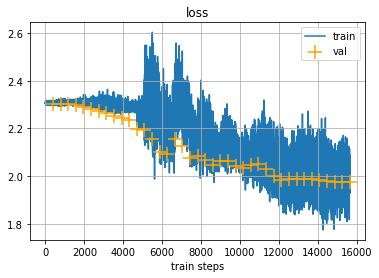

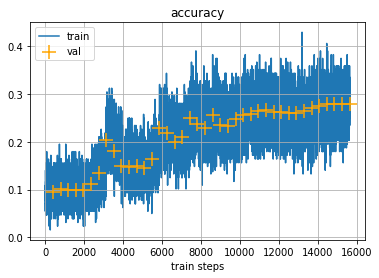

Final validaion accuracy: 27.98%
CPU times: user 5min 55s, sys: 22.8 s, total: 6min 18s
Wall time: 9min 47s


In [ ]:
%%time

trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                          shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=128,
                                         shuffle=False, num_workers=2)
model = ConvNet().cuda()
opt = torch.optim.SGD(model.parameters(), lr=0.4, momentum=0.9,
                      weight_decay=0.0005)
scheduler = torch.optim.lr_scheduler.OneCycleLR(opt, max_lr=0.4,
                                                total_steps=40)
train(model, opt, 40, X_train=trainloader, y_train=None, X_val=testloader,
      y_val=None, batchsize=128, step_last=True, scheduler=scheduler, clip=True,
      gradient_penalty=True)
_, test_acc = test(model, testloader, y=None)
torch.save({
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': opt.state_dict(),
            'test_acc': test_acc,
            }, "GD_cifar10_checkpoint_clip_GP")

# Repo

In [ ]:
!pip install hydra omegaconf

     |████████████████████████████████| 74 kB 2.7 MB/s 
     |████████████████████████████████| 112 kB 29.2 MB/s 
     |████████████████████████████████| 596 kB 45.6 MB/s 
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141230 sha256=d369db736bbb8428ba511fb0f12a805b28a232f72f0ecc02ae4bdc419a6d8f4e
  Stored in directory: /root/.cache/pip/wheels/ca/33/b7/336836125fc9bb4ceaa4376d8abca10ca8bc84ddc824baea6c
Successfully built antlr4-python3-runtime
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
 pip install hydra-core --upgrade

     |████████████████████████████████| 145 kB 12.0 MB/s 


In [ ]:
!git clone https://github.com/JonasGeiping/fullbatchtraining.git

Cloning into 'fullbatchtraining'...
remote: Enumerating objects: 195, done.
remote: Counting objects: 100% (195/195), done.
remote: Compressing objects: 100% (157/157), done.
remote: Total 195 (delta 69), reused 146 (delta 31), pack-reused 0
Receiving objects: 100% (195/195), 117.05 KiB | 9.75 MiB/s, done.
Resolving deltas: 100% (69/69), done.


In [ ]:
# для запуска именно MNIST необходимо изменить некоторые файлы репозитория
%cd fullbatchtraining/
!python train_with_gradient_descent.py name=fbaug_highreg_lr08 hyp=gradreg data.batch_size=60000
%cd ..

/content/fullbatchtraining
[2022-01-18 15:16:18,621] ---------------------------------------------------
[2022-01-18 15:16:18,622] -----Launching full-batch computation job! --------
[2022-01-18 15:16:18,656] data:
  db:
    name: null
  name: MNIST
  path: ~/data
  size: 60000
  channels: 1
  classes: 10
  pixels: 32
  normalize: false
  mean: null
  std: null
  batch_size: 60000
  augmentations_train: null
  augmentations_val: null
  caching: null
model:
  name: mnist_model
impl:
  setup:
    dist: false
    backend: nccl
    strategy: file_descriptor
    world_size: null
    rank: null
    url: null
  dtype: float
  memory: contiguous
  non_blocking: true
  benchmark: true
  deterministic: false
  pin_memory: true
  threads: 8
  persistent_workers: true
  mixed_precision: false
  grad_scaling: false
  JIT: null
  accumulation_dtype: float
  validate_every_nth_step: 1
  checkpoint:
    name: null
    save_every_nth_step: 1
hyp:
  optim:
    name: Gradient Descent
    lr: 0.8
    mome